In [ ]:
#%matplotlib widget

In [1]:
# =========================================================
# Cell 1 — MonsterTruck setup (MuJoCo) + state/transition API
#   State s = [sin(phi), cos(phi), omega]
#   Action u = throttle in [-1, 1]
#   GP input X = [sin(phi), cos(phi), omega, u]
#   GP target Y = [dphi, domega]
# =========================================================

import sys, os, math, time
import numpy as np
import mujoco

# Optional GPU sanity print (matches your style)
try:
    import torch
    print("Python exe:", sys.executable)
    print("Torch version:", torch.__version__)
    print("cuda.is_available:", torch.cuda.is_available())
    print("torch.version.cuda:", torch.version.cuda)
    print("build with cuda:", torch.backends.cuda.is_built())
    if torch.cuda.is_available():
        print("device:", torch.cuda.get_device_name(0))
except Exception as e:
    print("[Torch check skipped]", e)

# Allow Intel OpenMP to load multiple times (practical workaround on some systems)
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
os.environ["OMP_NUM_THREADS"] = "8"
os.environ["MKL_NUM_THREADS"] = "8"

# ------------------- Global config -------------------
SEED = 0
rng  = np.random.default_rng(SEED)

XML_PATH   = "monstertruck.xml"
FRAME_SKIP = 10                         # sim steps per control step
ACTION_LOW, ACTION_HIGH = -1.0, 1.0

# + pitch = toward the truck's front
PITCH_SIGN = +1

# Upright detection (radians) near pi
SUCCESS_ENTER_RAD    = np.deg2rad(178.0)
SUCCESS_RELEASE_RAD  = np.deg2rad(176.5)
MAX_UPRIGHT_RATE_RAD = np.deg2rad(60.0)
HOLD_NEEDED          = 1

# ------------------- Utility -------------------
def clip(v, lo, hi):
    return lo if v < lo else (hi if v > hi else v)

def wrap_pi(a):
    """Wrap angle to (-pi, pi]."""
    return ((a + np.pi) % (2.0 * np.pi)) - np.pi

def angdiff_rad(curr, prev):
    """Minimal signed difference in (-pi, pi]."""
    return wrap_pi(curr - prev)

# ------------------- Flip angle from orientation -------------------
def get_signed_flip_rad(data, body_id, roof_is_neg_z=True):
    """
    Flip angle phi [rad]:
      0   = upside-down
      ±pi = upright
    Positive = pitching toward the front (PITCH_SIGN).
    """
    R = data.xmat[body_id].reshape(3, 3)
    world_z = np.array([0.0, 0.0, 1.0], float)

    body_z = R[:, 2]
    roof_normal = -body_z if roof_is_neg_z else body_z
    body_y = R[:, 1]

    cross_vec = np.cross(world_z, roof_normal)
    c = float(np.dot(world_z, roof_normal))
    s_axis = float(np.dot(cross_vec, body_y))

    theta = math.atan2(np.linalg.norm(cross_vec), clip(c, -1.0, 1.0))

    # persistent sign latch for near-0 deg
    if not hasattr(get_signed_flip_rad, "_flip_sign"):
        get_signed_flip_rad._flip_sign = 0.0

    if theta > np.deg2rad(0.5) and abs(s_axis) > 1e-12:
        get_signed_flip_rad._flip_sign = 1.0 if (PITCH_SIGN * s_axis) > 0.0 else -1.0

    sign = get_signed_flip_rad._flip_sign if get_signed_flip_rad._flip_sign != 0.0 else 1.0
    return float(sign * theta)

# ------------------- Reset / control helpers -------------------
def reset_state(model, data):
    """Reset to upside-down pose with small height and zero velocity."""
    mujoco.mj_resetData(model, data)
    data.qpos[:3] = np.array([0.0, 0.0, 0.25])
    data.qvel[:]  = 0.0
    # 180° about X -> upside-down
    data.qpos[3:7] = np.array([0.0, 1.0, 0.0, 0.0])
    mujoco.mj_forward(model, data)
    get_signed_flip_rad._flip_sign = 0.0

def find_throttle_ids(model):
    """Actuator ids for wheel motors (fallback to all actuators)."""
    ids = []
    for name in ["front_left_motor", "front_right_motor",
                 "rear_left_motor", "rear_right_motor"]:
        aid = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_ACTUATOR, name)
        if aid != -1:
            ids.append(aid)
    if not ids:
        ids = list(range(model.nu))
    return ids

def apply_throttle(data, actuator_ids, u):
    if data.ctrl is None or data.ctrl.size == 0:
        return
    u = float(np.clip(u, ACTION_LOW, ACTION_HIGH))
    data.ctrl[:] = 0.0
    for aid in actuator_ids:
        data.ctrl[aid] = u

# ------------------- FlipTracker -------------------
class FlipTracker:
    """
    Tracks:
      - phi : wrapped in (-pi, pi]
      - omega : pitch rate rad/s (gyro preferred)
      - unwrapped : continuous angle (debug)
    """
    def __init__(self, dt_ctrl, roof_is_neg_z=True, gyro_id=None, pitch_axis_index=1):
        self.dt = float(dt_ctrl) if dt_ctrl > 0 else 1e-6
        self.roof_is_neg_z = bool(roof_is_neg_z)
        self.prev_phi = None
        self.unwrapped = 0.0
        self.gyro_id = gyro_id
        self.pitch_axis_index = int(pitch_axis_index)

    def reset(self):
        self.prev_phi = None
        self.unwrapped = 0.0
        get_signed_flip_rad._flip_sign = 0.0

    def step(self, data, body_id, model=None):
        phi = get_signed_flip_rad(data, body_id, roof_is_neg_z=self.roof_is_neg_z)

        if self.prev_phi is None:
            dphi = 0.0
        else:
            dphi = angdiff_rad(phi, self.prev_phi)

        self.unwrapped += dphi
        self.prev_phi = phi

        # Prefer gyro omega (wy)
        if (self.gyro_id is not None) and (model is not None):
            adr = model.sensor_adr[self.gyro_id]
            gyro = data.sensordata[adr: adr + 3]  # [wx, wy, wz]
            omega = float(gyro[self.pitch_axis_index]) * PITCH_SIGN
        else:
            omega = dphi / self.dt

        return float(phi), float(omega), float(self.unwrapped)

def make_flip_tracker(model, frame_skip=FRAME_SKIP, gyro_sensor_name="imu_gyro"):
    dt_ctrl = model.opt.timestep * frame_skip
    gyro_id = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_SENSOR, gyro_sensor_name)
    if gyro_id < 0:
        gyro_id = None
    return FlipTracker(dt_ctrl=dt_ctrl, roof_is_neg_z=True, gyro_id=gyro_id, pitch_axis_index=1)

# ------------------- Build model + IDs -------------------
model = mujoco.MjModel.from_xml_path(XML_PATH)
data  = mujoco.MjData(model)

dt_ctrl = model.opt.timestep * FRAME_SKIP

chassis_id = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_BODY, "chassis")
if chassis_id == -1:
    chassis_id = 0

throttle_ids = find_throttle_ids(model)

flip_tracker = make_flip_tracker(model, frame_skip=FRAME_SKIP)
reset_state(model, data)
flip_tracker.reset()

print("[Cell 1] Loaded MuJoCo model.")
print(f"[Cell 1] dt_ctrl = {dt_ctrl:.4f}s, frame_skip={FRAME_SKIP}")
print(f"[Cell 1] throttle actuators = {throttle_ids}")

# ------------------- Transition API (used by GP + MPPI later) -------------------
def get_state_features(phi, omega):
    """
    Stable features for GP input (avoid angle discontinuity):
      s_feat = [sin(phi), cos(phi), omega]
    """
    return np.array([math.sin(phi), math.cos(phi), float(omega)], dtype=np.float32)

def step_env_once(u):
    """
    One control step:
      - apply throttle u
      - advance physics FRAME_SKIP steps
      - return (phi, omega) AFTER step
    """
    apply_throttle(data, throttle_ids, u)
    for _ in range(FRAME_SKIP):
        mujoco.mj_step(model, data)
    phi, omega, _ = flip_tracker.step(data, chassis_id, model=model)
    return phi, omega

def transition_from(phi_prev, omega_prev, u):
    """
    Deterministic transition label from (phi_prev, omega_prev, u):
      executes env one step and returns:
        X = [sin(phi_prev), cos(phi_prev), omega_prev, u]
        Y = [dphi, domega]
    NOTE: This assumes the simulator is currently *at* (phi_prev, omega_prev).
          In data collection we will always use the simulator directly, so this
          function is mostly for explanation consistency.
    """
    # take step
    phi_curr, omega_curr = step_env_once(u)

    dphi   = angdiff_rad(phi_curr, phi_prev)
    domega = float(omega_curr - omega_prev)

    X = np.array([math.sin(phi_prev), math.cos(phi_prev), float(omega_prev), float(u)], dtype=np.float32)
    Y = np.array([float(dphi), float(domega)], dtype=np.float32)
    return X, Y, phi_curr, omega_curr

print("[Cell 1] Transition definition ready:")
print("        X = [sin(phi), cos(phi), omega, u]  ->  Y = [dphi, domega]")


Python exe: C:\Users\wts28\anaconda3\python.exe
Torch version: 2.5.1+cu121
cuda.is_available: True
torch.version.cuda: 12.1
build with cuda: True
device: NVIDIA GeForce RTX 4080
[Cell 1] Loaded MuJoCo model.
[Cell 1] dt_ctrl = 0.0100s, frame_skip=10
[Cell 1] throttle actuators = [0, 1, 2, 3]
[Cell 1] Transition definition ready:
        X = [sin(phi), cos(phi), omega, u]  ->  Y = [dphi, domega]


In [2]:
# =========================================================
# Cell 2 — Debug viewer (phi rad + omega rad/s)
# Keys: W=+throttle, S=−throttle, SPACE=0, ESC=quit
# =========================================================

import time
import numpy as np
import mujoco
from mujoco.glfw import glfw

# --- Load model/data fresh for viewer safety (independent cell) ---
model = mujoco.MjModel.from_xml_path(XML_PATH)
data  = mujoco.MjData(model)

dt_ctrl = model.opt.timestep * FRAME_SKIP

chassis_id = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_BODY, "chassis")
if chassis_id == -1:
    chassis_id = 0

throttle_ids = find_throttle_ids(model)

# gyro setup (required)
gyro_id = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_SENSOR, "imu_gyro")
if gyro_id < 0:
    raise RuntimeError("imu_gyro sensor not found in XML")
gyro_adr = model.sensor_adr[gyro_id]

# tracker
flip_tracker = make_flip_tracker(model, frame_skip=FRAME_SKIP)
reset_state(model, data)
flip_tracker.reset()

# --- GLFW window init ---
if not glfw.init():
    raise RuntimeError("GLFW init failed")

window = glfw.create_window(1000, 800, "MonsterTruck Debug — phi(rad), omega(rad/s)", None, None)
if not window:
    glfw.terminate()
    raise RuntimeError("GLFW window creation failed")

glfw.make_context_current(window)
glfw.swap_interval(1)

cam = mujoco.MjvCamera()
opt = mujoco.MjvOption()
scene = mujoco.MjvScene(model, maxgeom=10000)
context = mujoco.MjrContext(model, mujoco.mjtFontScale.mjFONTSCALE_150)

cam.distance = 3.0
cam.elevation = -25
cam.azimuth = 90

# --- Manual throttle control ---
throttle = 0.0

def key_callback(window, key, scancode, action, mods):
    global throttle
    if action in (glfw.PRESS, glfw.REPEAT):
        if key == glfw.KEY_W:
            throttle = +1.0
        elif key == glfw.KEY_S:
            throttle = -1.0
        elif key == glfw.KEY_SPACE:
            throttle = 0.0
    elif action == glfw.RELEASE and key in (glfw.KEY_W, glfw.KEY_S):
        throttle = 0.0

glfw.set_key_callback(window, key_callback)

# --- Realtime pacing (optional) ---
REALTIME = True
last_print = time.perf_counter()
sim_start_wall = last_print

print("Controls: W=+thr, S=-thr, SPACE=0, ESC=quit")
print(f"dt_ctrl={dt_ctrl:.4f}s (FRAME_SKIP={FRAME_SKIP}, timestep={model.opt.timestep:.5f})")

while not glfw.window_should_close(window):
    # ESC quit
    if glfw.get_key(window, glfw.KEY_ESCAPE) == glfw.PRESS:
        break

    # apply throttle + step physics
    apply_throttle(data, throttle_ids, throttle)
    for _ in range(FRAME_SKIP):
        mujoco.mj_step(model, data)

    # realtime pacing
    if REALTIME:
        target_wall = sim_start_wall + data.time
        now = time.perf_counter()
        if now < target_wall:
            time.sleep(target_wall - now)

    # camera follow chassis
    cam.lookat[:] = data.xpos[chassis_id]

    # render
    w, h = glfw.get_framebuffer_size(window)
    if w > 0 and h > 0:
        mujoco.mjv_updateScene(
            model, data, opt, None, cam,
            mujoco.mjtCatBit.mjCAT_ALL, scene
        )
        viewport = mujoco.MjrRect(0, 0, w, h)
        mujoco.mjr_render(viewport, scene, context)

    glfw.swap_buffers(window)
    glfw.poll_events()

    # compute phi + omega
    phi = get_signed_flip_rad(data, chassis_id, roof_is_neg_z=True)

    gyro = data.sensordata[gyro_adr : gyro_adr + 3]  # [wx, wy, wz]
    omega = float(gyro[1]) * PITCH_SIGN              # pitch axis wy

    # print every 0.25s
    now = time.perf_counter()
    if now - last_print > 0.25:
        speed_ratio = data.time / (now - sim_start_wall + 1e-12)
        pos = data.xpos[chassis_id]
        print(
            f"t={data.time:6.2f}s  "
            f"pos=({pos[0]:+.2f},{pos[1]:+.2f},{pos[2]:+.2f})  "
            f"phi={phi:+7.3f} rad  omega={omega:+7.3f} rad/s  "
            f"thr={throttle:+.2f}  x{speed_ratio:.2f}"
        )
        last_print = now

glfw.terminate()
print("Debug viewer terminated.")


Controls: W=+thr, S=-thr, SPACE=0, ESC=quit
dt_ctrl=0.0100s (FRAME_SKIP=10, timestep=0.00100)
t=  0.25s  pos=(+0.00,-0.00,+0.23)  phi= +0.000 rad  omega= -0.000 rad/s  thr=+0.00  x1.00
t=  0.50s  pos=(+0.00,-0.00,+0.23)  phi= +0.000 rad  omega= +0.000 rad/s  thr=+0.00  x1.00
t=  0.76s  pos=(+0.00,-0.00,+0.23)  phi= +0.000 rad  omega= +0.000 rad/s  thr=+0.00  x1.00
t=  1.01s  pos=(-0.00,-0.00,+0.23)  phi= +0.000 rad  omega= +0.000 rad/s  thr=+0.00  x1.00
t=  1.26s  pos=(+0.00,+0.00,+0.23)  phi= +0.000 rad  omega= +0.000 rad/s  thr=+0.00  x1.00
t=  1.52s  pos=(-0.00,+0.00,+0.23)  phi= +0.000 rad  omega= +0.000 rad/s  thr=+0.00  x1.00
t=  1.77s  pos=(-0.00,+0.00,+0.23)  phi= +0.000 rad  omega= -0.000 rad/s  thr=+0.00  x1.00
t=  2.02s  pos=(-0.00,+0.00,+0.23)  phi= +0.000 rad  omega= -0.000 rad/s  thr=+0.00  x1.00
t=  2.28s  pos=(-0.00,+0.00,+0.23)  phi= +0.000 rad  omega= -0.000 rad/s  thr=+0.00  x1.00
t=  2.54s  pos=(-0.00,+0.00,+0.23)  phi= +0.000 rad  omega= +0.000 rad/s  thr=+0.00  x1

[Cell 3] dt_ctrl=0.0100s, steps=8000
[Cell 3] omega_feat = tanh(omega/50.0)
[Cell 3] smooth throttle: DU_MAX=0.08, noise_std=0.15
[Cell 3] rare kicks: p=0.01, len=[3,10]
[Cell 3] collecting transitions...
[Cell 3] step=2000/8000  samples=2000  u≈[-0.94,+1.00]  time=0.5s
[Cell 3] step=4000/8000  samples=4000  u≈[-0.94,+1.00]  time=1.0s
[Cell 3] step=6000/8000  samples=6000  u≈[-0.94,+1.00]  time=1.4s
[Cell 3] step=8000/8000  samples=8000  u≈[-0.94,+1.00]  time=1.9s
[Cell 3] done.
[Cell 3] X=(8000, 4) (sin,cos,omega_feat,u), Y=(8000, 2) (dphi,domega)
[Cell 3] omega raw range ≈ [-1.472, +1.897] rad/s
[Cell 3] omega_feat range ≈ [-0.029, +0.038]


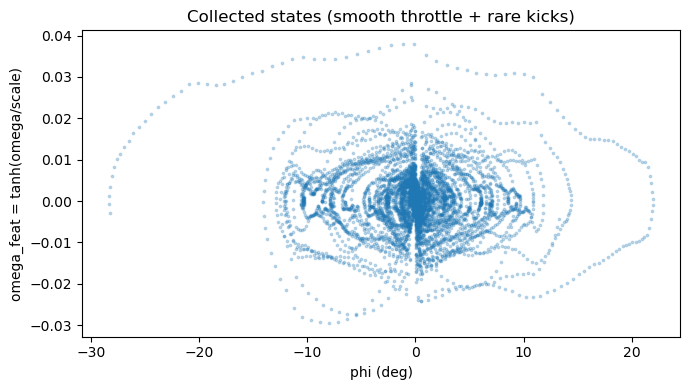

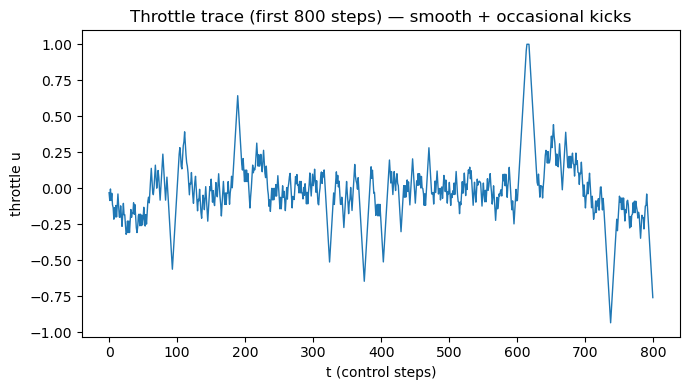

[Cell 3] saved to 'monstertruck_gp_initial_data.npz'
         GP format: X=[sin(phi),cos(phi),tanh(omega/scale),u] -> Y=[dphi,domega]


In [6]:
# =========================================================
# Cell 3 — Initial data collection (smooth continuous throttle)
#   GP input  X = [sin(phi), cos(phi), omega_feat, u]
#   GP target Y = [dphi, domega]
#
# Design:
#   - Continuous throttle via rate limiter (smooth u trace)
#   - Reduced saturation (better GP regression quality)
#   - Rare short "kicks" to inject energy (still learn flip dynamics)
# =========================================================

import time, math
import numpy as np
import mujoco
import matplotlib.pyplot as plt

# ------------------- Config -------------------
TOTAL_CTRL_STEPS = 8000
EPISODE_LEN_MAX  = 3000

PRIME_CTRL_STEPS = 250
PRIME_AMPL       = 0.8

PRINT_EVERY = 2000

# omega feature scaling (rad/s)
OMEGA_SCALE = 50.0

# Throttle smoothing / continuity
DU_MAX = 0.08          # max throttle change per control step (smaller = smoother)
U_NOISE_STD = 0.15     # small continuous noise (keeps exploration)

# Rare excitation "kicks" (short impulses)
KICK_PROB  = 0.01      # probability per step
KICK_LEN_MIN = 3
KICK_LEN_MAX = 10
KICK_AMPL = 1.0

# ------------------- Exploration policy -------------------
def swing_cont_policy(phi_rad, omega_rad, k=1.0, bias=0.0):
    """
    Smooth swing-like continuous policy (less saturation than before).
    """
    # keep it modest; let the rate limiter + noise do the exploration
    base = k * np.tanh(omega_rad / 4.0) + bias * np.sign(omega_rad)
    return float(base)

# ------------------- Setup MuJoCo -------------------
model = mujoco.MjModel.from_xml_path(XML_PATH)
data  = mujoco.MjData(model)

dt_ctrl      = model.opt.timestep * FRAME_SKIP
flip_tracker = make_flip_tracker(model, frame_skip=FRAME_SKIP)

chassis_id = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_BODY, "chassis")
if chassis_id == -1:
    chassis_id = 0

throttle_ids = find_throttle_ids(model)

print(f"[Cell 3] dt_ctrl={dt_ctrl:.4f}s, steps={TOTAL_CTRL_STEPS}")
print(f"[Cell 3] omega_feat = tanh(omega/{OMEGA_SCALE})")
print(f"[Cell 3] smooth throttle: DU_MAX={DU_MAX}, noise_std={U_NOISE_STD}")
print(f"[Cell 3] rare kicks: p={KICK_PROB}, len=[{KICK_LEN_MIN},{KICK_LEN_MAX}]")

# ------------------- Reset episode -------------------
def reset_episode():
    reset_state(model, data)
    flip_tracker.reset()

    # prime pushes (shorter + a bit smaller so we don't always saturate)
    for _ in range(PRIME_CTRL_STEPS):
        sgn = 1.0 if rng.uniform() < 0.5 else -1.0
        apply_throttle(data, throttle_ids, PRIME_AMPL * sgn)
        for _ in range(FRAME_SKIP):
            mujoco.mj_step(model, data)

    flip_tracker.reset()
    phi0, omega0, _ = flip_tracker.step(data, chassis_id, model=model)
    return float(phi0), float(omega0)

# ------------------- Storage -------------------
X_list, Y_list = [], []

phi_log, omega_raw_log, omega_feat_log, u_log = [], [], [], []

u_min, u_max = +np.inf, -np.inf

phi_prev, omega_prev = reset_episode()

ctrl_steps_done = 0
episode_step    = 0
start_wall      = time.perf_counter()

# action state
u_curr = 0.0

# kick state
kick_steps_left = 0
kick_sign = +1.0

print("[Cell 3] collecting transitions...")

while ctrl_steps_done < TOTAL_CTRL_STEPS:

    # reset episode
    if episode_step >= EPISODE_LEN_MAX:
        phi_prev, omega_prev = reset_episode()
        episode_step = 0
        u_curr = 0.0
        kick_steps_left = 0

    # -------- choose raw desired action u_raw --------
    if kick_steps_left > 0:
        # kick mode: short impulse to excite dynamics
        u_raw = float(kick_sign * KICK_AMPL)
        kick_steps_left -= 1
    else:
        # start a kick occasionally
        if rng.uniform() < KICK_PROB:
            kick_steps_left = int(rng.integers(KICK_LEN_MIN, KICK_LEN_MAX + 1))
            kick_sign = float(rng.choice([-1.0, +1.0]))
            u_raw = float(kick_sign * KICK_AMPL)
            kick_steps_left -= 1
        else:
            # smooth swing baseline + small continuous noise
            u_raw = swing_cont_policy(phi_prev, omega_prev, k=1.0, bias=0.0)
            u_raw += float(U_NOISE_STD * rng.normal())

    # -------- enforce continuity (rate limit) --------
    u_curr = float(np.clip(u_raw, u_curr - DU_MAX, u_curr + DU_MAX))
    u_curr = float(np.clip(u_curr, ACTION_LOW, ACTION_HIGH))

    u_min = min(u_min, u_curr)
    u_max = max(u_max, u_curr)

    # step physics
    apply_throttle(data, throttle_ids, u_curr)
    for _ in range(FRAME_SKIP):
        mujoco.mj_step(model, data)

    ctrl_steps_done += 1

    # observe next state
    phi_curr, omega_curr, _ = flip_tracker.step(data, chassis_id, model=model)

    # targets
    dphi   = angdiff_rad(phi_curr, phi_prev)
    domega = float(omega_curr - omega_prev)

    # omega feature (NO clipping)
    omega_feat = float(np.tanh(float(omega_prev) / float(OMEGA_SCALE)))

    # save GP pair
    X_list.append([math.sin(phi_prev), math.cos(phi_prev), omega_feat, u_curr])
    Y_list.append([float(dphi), float(domega)])

    # logs
    phi_log.append(phi_prev)
    omega_raw_log.append(omega_prev)
    omega_feat_log.append(omega_feat)
    u_log.append(u_curr)

    # advance
    phi_prev, omega_prev = float(phi_curr), float(omega_curr)
    episode_step += 1

    if ctrl_steps_done % PRINT_EVERY == 0:
        elapsed = time.perf_counter() - start_wall
        print(f"[Cell 3] step={ctrl_steps_done}/{TOTAL_CTRL_STEPS}  "
              f"samples={len(X_list)}  u≈[{u_min:+.2f},{u_max:+.2f}]  "
              f"time={elapsed:.1f}s")

print("[Cell 3] done.")

# pack
X = np.asarray(X_list, dtype=np.float32)   # (N,4)
Y = np.asarray(Y_list, dtype=np.float32)   # (N,2)

phi_arr        = np.asarray(phi_log, dtype=np.float32)
omega_raw_arr  = np.asarray(omega_raw_log, dtype=np.float32)
omega_feat_arr = np.asarray(omega_feat_log, dtype=np.float32)
u_arr          = np.asarray(u_log, dtype=np.float32)

print(f"[Cell 3] X={X.shape} (sin,cos,omega_feat,u), Y={Y.shape} (dphi,domega)")
print(f"[Cell 3] omega raw range ≈ [{omega_raw_arr.min():+.3f}, {omega_raw_arr.max():+.3f}] rad/s")
print(f"[Cell 3] omega_feat range ≈ [{omega_feat_arr.min():+.3f}, {omega_feat_arr.max():+.3f}]")

# sanity plots
plt.figure(figsize=(7,4))
plt.scatter(np.rad2deg(phi_arr), omega_feat_arr, s=3, alpha=0.25)
plt.xlabel("phi (deg)")
plt.ylabel("omega_feat = tanh(omega/scale)")
plt.title("Collected states (smooth throttle + rare kicks)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(7,4))
plt.plot(u_arr[:800], lw=1)
plt.xlabel("t (control steps)")
plt.ylabel("throttle u")
plt.title("Throttle trace (first 800 steps) — smooth + occasional kicks")
plt.tight_layout()
plt.show()

# save
np.savez_compressed(
    "monstertruck_gp_initial_data.npz",
    X=X, Y=Y,
    phi=phi_arr,
    omega_raw=omega_raw_arr,
    omega_feat=omega_feat_arr,
    u=u_arr,
    dt_ctrl=float(dt_ctrl),
    omega_scale=float(OMEGA_SCALE),
    u_min=float(u_min), u_max=float(u_max),
    du_max=float(DU_MAX),
)

print("[Cell 3] saved to 'monstertruck_gp_initial_data.npz'")
print("         GP format: X=[sin(phi),cos(phi),tanh(omega/scale),u] -> Y=[dphi,domega]")


[Cell 4] Loaded: (8000, 4) (8000, 2)
[Cell 4] Train: (6400, 4), Test: (1600, 4)
[Cell 4] Models created. M = 128

[Cell 4] Training model_dphi...
  iter    0 | -ELBO=-3565758.066388 | noise=9.804e-05
  iter  100 | -ELBO=-1178790516.610437 | noise=5.332e-06
  iter  200 | -ELBO=-30010566069.130558 | noise=1.088e-06
  iter  300 | -ELBO=-33811472694.806702 | noise=1.026e-06
  iter  400 | -ELBO=-34709350316.388504 | noise=1.014e-06
  iter  500 | -ELBO=-34915409122.623367 | noise=1.009e-06
  iter  600 | -ELBO=-35107027375.257820 | noise=1.007e-06
  iter  700 | -ELBO=-35264514792.998215 | noise=1.005e-06
  iter  800 | -ELBO=-35408293124.329185 | noise=1.004e-06
  iter  900 | -ELBO=-35406957630.319550 | noise=1.003e-06
  iter 1000 | -ELBO=-35386851702.898613 | noise=1.003e-06
  iter 1100 | -ELBO=-35420223127.610863 | noise=1.002e-06
  iter 1199 | -ELBO=-35494548030.989929 | noise=1.002e-06
  done in 28.15s

[Cell 4] Training model_domega...
  iter    0 | -ELBO=-2171890.729606 | noise=9.802e-04

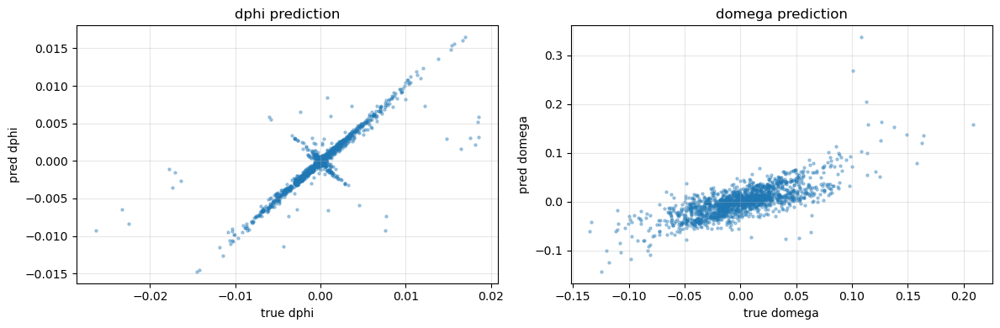

[Cell 4] Done.


In [11]:
# =========================================================
# Cell 4 — Initial Sparse GP (VFE / SGPR ELBO) for MonsterTruck
#   X = [sin(phi), cos(phi), omega_feat, u]   (N,4)
#   Y = [dphi, domega]                        (N,2)
#
# FIXED:
#   ✅ GPModel(num_latent_gps=1)
#   ✅ predict_f implemented
#   ✅ dtype-safe constants (no float32/float64 mismatch)
# =========================================================

import time
import numpy as np
import tensorflow as tf
import gpflow
import matplotlib.pyplot as plt

from gpflow.inducing_variables import InducingPoints
from gpflow.models import GPModel, InternalDataTrainingLossMixin

# ----------------------------
# Setup
# ----------------------------
gpflow.config.set_default_float(np.float64)
gpflow.config.set_default_jitter(1e-6)
tf.keras.backend.set_floatx("float64")

DTYPE = gpflow.default_float()

SEED = 0
rng = np.random.default_rng(SEED)
tf.random.set_seed(SEED)

def sym_jitter_tf(A, jitter=None):
    if jitter is None:
        jitter = gpflow.config.default_jitter()
    A = tf.cast(A, DTYPE)
    A = 0.5 * (A + tf.transpose(A))
    return A + tf.cast(jitter, DTYPE) * tf.eye(tf.shape(A)[0], dtype=DTYPE)

# dtype-safe constants
LOG_2PI = tf.math.log(tf.constant(2.0 * np.pi, dtype=DTYPE))
NEG_HALF = tf.constant(-0.5, dtype=DTYPE)

# ----------------------------
# Load dataset
# ----------------------------
npz = np.load("monstertruck_gp_initial_data.npz")
X_all = npz["X"].astype(np.float64)  # (N,4)
Y_all = npz["Y"].astype(np.float64)  # (N,2)

print("[Cell 4] Loaded:", X_all.shape, Y_all.shape)

mask = np.isfinite(X_all).all(axis=1) & np.isfinite(Y_all).all(axis=1)
X_all = X_all[mask]
Y_all = Y_all[mask]

# ----------------------------
# Train/test split
# ----------------------------
N = X_all.shape[0]
perm = rng.permutation(N)
n_train = int(0.80 * N)

idx_tr = perm[:n_train]
idx_te = perm[n_train:]

Xtr = X_all[idx_tr]
Ytr = Y_all[idx_tr]
Xte = X_all[idx_te]
Yte = Y_all[idx_te]

ytr_dphi   = Ytr[:, 0:1]
ytr_domega = Ytr[:, 1:2]

yte_dphi   = Yte[:, 0:1]
yte_domega = Yte[:, 1:2]

print(f"[Cell 4] Train: {Xtr.shape}, Test: {Xte.shape}")

Xtr_tf = tf.constant(Xtr, dtype=DTYPE)
Xte_tf = tf.constant(Xte, dtype=DTYPE)

ytr_dphi_tf   = tf.constant(ytr_dphi, dtype=DTYPE)
ytr_domega_tf = tf.constant(ytr_domega, dtype=DTYPE)

# =========================================================
# Sparse GP model (VFE / SGPR ELBO) with predict_f
# =========================================================
class OSGPR_VFE(GPModel, InternalDataTrainingLossMixin):
    """
    Stable VFE / SGPR ELBO (Titsias 2009) for one-output GP.
    Enough for initial training + prediction + MPPI rollouts.

    Streaming "old summary" slots exist for future (cell 7+),
    but initial training ignores them.
    """
    def __init__(self, data, kernel, inducing_variable,
                 mu_old, Su_old, Kaa_old, Z_old,
                 noise_variance=1e-4):

        super().__init__(
            kernel=kernel,
            likelihood=gpflow.likelihoods.Gaussian(noise_variance),
            mean_function=None,
            num_latent_gps=1
        )

        self.data = data
        self.inducing_variable = inducing_variable

        # stored for streaming later (not used in initial ELBO)
        self.mu_old  = tf.Variable(mu_old,  trainable=False, dtype=DTYPE)
        self.Su_old  = tf.Variable(Su_old,  trainable=False, dtype=DTYPE)
        self.Kaa_old = tf.Variable(Kaa_old, trainable=False, dtype=DTYPE)
        self.Z_old   = tf.Variable(Z_old,   trainable=False, dtype=DTYPE)

    def maximum_log_likelihood_objective(self):
        """
        SGPR / VFE ELBO:
          const = -0.5 N log(2π)
          logterm = -0.5 ( N log σ² + log|A| - log|Kzz| )
          quad = -0.5/σ² ( ||y||² - ||c||² )
          trace = -0.5/σ² Tr(Kxx - Qxx)
        """
        X, Y = self.data
        Z = self.inducing_variable.Z

        X = tf.cast(X, DTYPE)
        Y = tf.cast(Y, DTYPE)
        Z = tf.cast(Z, DTYPE)

        sigma2 = tf.cast(self.likelihood.variance, DTYPE)
        jitter = gpflow.config.default_jitter()

        Nf = tf.cast(tf.shape(X)[0], DTYPE)

        # Kernel blocks
        Kzz = sym_jitter_tf(self.kernel.K(Z), jitter)
        Kzx = tf.cast(self.kernel.K(Z, X), DTYPE)          # (M,N)

        # Cholesky Kzz
        Lz = tf.linalg.cholesky(Kzz)

        # Qxx diag = || Lz^{-1} Kzx ||^2
        Lz_inv_Kzx = tf.linalg.triangular_solve(Lz, Kzx)
        Qxx_diag = tf.reduce_sum(tf.square(Lz_inv_Kzx), axis=0)  # (N,)

        # A = Kzz + (1/σ²) Kzx Kxz
        A = Kzz + (tf.constant(1.0, DTYPE) / sigma2) * tf.matmul(Kzx, tf.transpose(Kzx))
        A = sym_jitter_tf(A, jitter)
        LA = tf.linalg.cholesky(A)

        # c = LA^{-1} (Kzx y / σ²)
        rhs = (tf.constant(1.0, DTYPE) / sigma2) * tf.matmul(Kzx, Y)   # (M,1)
        c = tf.linalg.triangular_solve(LA, rhs)

        # log dets
        logdetA = tf.constant(2.0, DTYPE) * tf.reduce_sum(tf.math.log(tf.linalg.diag_part(LA)))
        logdetKzz = tf.constant(2.0, DTYPE) * tf.reduce_sum(tf.math.log(tf.linalg.diag_part(Lz)))

        # terms (dtype-safe)
        const = NEG_HALF * Nf * LOG_2PI
        logterm = NEG_HALF * (Nf * tf.math.log(sigma2) + logdetA - logdetKzz)

        y2 = tf.reduce_sum(tf.square(Y))
        c2 = tf.reduce_sum(tf.square(c))
        quad = NEG_HALF * (y2 - c2) / sigma2

        Kxx_diag = tf.cast(self.kernel.K_diag(X), DTYPE)
        trace = NEG_HALF * tf.reduce_sum(Kxx_diag - Qxx_diag) / sigma2

        elbo = const + logterm + quad + trace
        return elbo

    def predict_f(self, Xnew, full_cov=False, full_output_cov=False):
        """
        Sparse predictive mean/variance for f(x), no observation noise.
        mean = KxZ A^{-1} KZx y / σ²
        var  = Kxx - KxZ A^{-1} KZx
        """
        X, Y = self.data
        Z = self.inducing_variable.Z

        X = tf.cast(X, DTYPE)
        Y = tf.cast(Y, DTYPE)
        Z = tf.cast(Z, DTYPE)
        Xnew = tf.cast(Xnew, DTYPE)

        sigma2 = tf.cast(self.likelihood.variance, DTYPE)
        jitter = gpflow.config.default_jitter()

        Kzz = sym_jitter_tf(self.kernel.K(Z), jitter)
        Kzx = tf.cast(self.kernel.K(Z, X), DTYPE)              # (M,N)

        A = Kzz + (tf.constant(1.0, DTYPE) / sigma2) * tf.matmul(Kzx, tf.transpose(Kzx))
        A = sym_jitter_tf(A, jitter)
        LA = tf.linalg.cholesky(A)

        rhs = (tf.constant(1.0, DTYPE) / sigma2) * tf.matmul(Kzx, Y)   # (M,1)
        alpha = tf.linalg.cholesky_solve(LA, rhs)                      # (M,1)

        KxZ = tf.cast(self.kernel.K(Xnew, Z), DTYPE)                   # (N*,M)
        mean = tf.matmul(KxZ, alpha)                                   # (N*,1)

        if not full_cov:
            Kxx_diag = tf.cast(self.kernel.K_diag(Xnew), DTYPE)        # (N*,)
            KZx = tf.transpose(KxZ)                                    # (M,N*)
            v = tf.linalg.cholesky_solve(LA, KZx)                      # (M,N*)
            q = tf.reduce_sum(KxZ * tf.transpose(v), axis=1)           # (N*,)
            var = tf.expand_dims(Kxx_diag - q, axis=1)
            var = tf.maximum(var, tf.constant(1e-12, DTYPE))
            return mean, var
        else:
            Kxx = tf.cast(self.kernel.K(Xnew), DTYPE)                  # (N*,N*)
            KZx = tf.transpose(KxZ)
            v = tf.linalg.cholesky_solve(LA, KZx)
            Q = tf.matmul(KxZ, v)
            cov = sym_jitter_tf(Kxx - Q, jitter)
            return mean, cov

# ----------------------------
# Prior summary (old posterior = prior) for initial training
# ----------------------------
def prior_summary(kernel, Z):
    Kzz = kernel.K(tf.constant(Z, dtype=DTYPE))
    Kzz = sym_jitter_tf(Kzz)
    mu0 = np.zeros((Z.shape[0], 1), dtype=np.float64)
    Su0 = Kzz.numpy()
    return mu0, Su0, Su0, Z.copy()

# ----------------------------
# Training helper (dtype-safe)
# ----------------------------
def train_osgpr(model, iters=1200, lr=0.02, verbose=True):
    opt = tf.keras.optimizers.Adam(lr)

    @tf.function
    def step():
        with tf.GradientTape() as tape:
            loss = -model.maximum_log_likelihood_objective()
        grads = tape.gradient(loss, model.trainable_variables)
        opt.apply_gradients(zip(grads, model.trainable_variables))
        return loss

    t0 = time.perf_counter()
    for i in range(iters):
        loss = step()
        if verbose and (i % 100 == 0 or i == iters - 1):
            print(f"  iter {i:4d} | -ELBO={loss.numpy():.6f} | noise={model.likelihood.variance.numpy():.3e}")
    print(f"  done in {time.perf_counter() - t0:.2f}s")

# ----------------------------
# Build kernels + inducing points
# ----------------------------
D = Xtr.shape[1]
M = 128

Z0 = Xtr[rng.choice(Xtr.shape[0], size=M, replace=False)]

kernel_dphi   = gpflow.kernels.Matern52(lengthscales=np.ones(D), variance=1.0)
kernel_domega = gpflow.kernels.Matern52(lengthscales=np.ones(D), variance=1.0)

mu0_phi, Su0_phi, Kaa0_phi, Zold_phi = prior_summary(kernel_dphi, Z0)
mu0_om,  Su0_om,  Kaa0_om,  Zold_om  = prior_summary(kernel_domega, Z0)

# ----------------------------
# Build models
# ----------------------------
model_dphi = OSGPR_VFE(
    data=(Xtr_tf, ytr_dphi_tf),
    kernel=kernel_dphi,
    inducing_variable=InducingPoints(tf.constant(Z0, dtype=DTYPE)),
    mu_old=tf.constant(mu0_phi, dtype=DTYPE),
    Su_old=tf.constant(Su0_phi, dtype=DTYPE),
    Kaa_old=tf.constant(Kaa0_phi, dtype=DTYPE),
    Z_old=tf.constant(Zold_phi, dtype=DTYPE),
    noise_variance=1e-4
)

model_domega = OSGPR_VFE(
    data=(Xtr_tf, ytr_domega_tf),
    kernel=kernel_domega,
    inducing_variable=InducingPoints(tf.constant(Z0, dtype=DTYPE)),
    mu_old=tf.constant(mu0_om, dtype=DTYPE),
    Su_old=tf.constant(Su0_om, dtype=DTYPE),
    Kaa_old=tf.constant(Kaa0_om, dtype=DTYPE),
    Z_old=tf.constant(Zold_om, dtype=DTYPE),
    noise_variance=1e-3
)

print("[Cell 4] Models created. M =", M)

# ----------------------------
# Train
# ----------------------------
print("\n[Cell 4] Training model_dphi...")
train_osgpr(model_dphi, iters=1200, lr=0.02, verbose=True)

print("\n[Cell 4] Training model_domega...")
train_osgpr(model_domega, iters=1500, lr=0.02, verbose=True)

# ----------------------------
# Evaluate RMSE on test set
# ----------------------------
mu_phi, _ = model_dphi.predict_f(Xte_tf, full_cov=False)
mu_om,  _ = model_domega.predict_f(Xte_tf, full_cov=False)

mu_phi = mu_phi.numpy().reshape(-1)
mu_om  = mu_om.numpy().reshape(-1)

rmse_phi = np.sqrt(np.mean((mu_phi - yte_dphi.reshape(-1))**2))
rmse_om  = np.sqrt(np.mean((mu_om  - yte_domega.reshape(-1))**2))

print("\n[Cell 4] Test RMSE:")
print(f"   dphi   RMSE = {rmse_phi:.6f} rad")
print(f"   domega RMSE = {rmse_om:.6f} rad/s")

# ----------------------------
# Quick scatter plots
# ----------------------------
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].scatter(yte_dphi.reshape(-1), mu_phi, s=5, alpha=0.35)
ax[0].set_xlabel("true dphi")
ax[0].set_ylabel("pred dphi")
ax[0].set_title("dphi prediction")
ax[0].grid(True, alpha=0.3)

ax[1].scatter(yte_domega.reshape(-1), mu_om, s=5, alpha=0.35)
ax[1].set_xlabel("true domega")
ax[1].set_ylabel("pred domega")
ax[1].set_title("domega prediction")
ax[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("[Cell 4] Done.")


In [16]:
# =========================================================
# Cell 5 — INTERACTIVE evaluation plots (Plotly 3D)
#   Surfaces:
#     - mean Δphi(φ, ω) colored by std
#     - mean Δomega(φ, ω) colored by std
#
# X = [sin(phi), cos(phi), omega_feat, u]
# omega_feat = tanh(omega_raw / omega_scale)
# =========================================================

import numpy as np
import tensorflow as tf
import gpflow
import plotly.graph_objects as go

# ----------------------------
# Controls
# ----------------------------
u_eval = 0.0
N_PHI  = 200
N_OMEGA = 200

phi_min_deg, phi_max_deg = -180.0, 180.0
omega_min_raw = -200.0
omega_max_raw = +200.0

# Load omega_scale saved from Cell 3 (fallback if missing)
try:
    omega_scale = float(np.load("monstertruck_gp_initial_data.npz")["omega_scale"])
except Exception:
    omega_scale = 50.0

print(f"[Cell 5] omega_scale={omega_scale:.3f} rad/s, u_eval={u_eval:+.2f}")

DTYPE = gpflow.default_float()

# ----------------------------
# Build query grid
# ----------------------------
phi_deg = np.linspace(phi_min_deg, phi_max_deg, N_PHI)
phi_rad = np.deg2rad(phi_deg)

omega_raw = np.linspace(omega_min_raw, omega_max_raw, N_OMEGA)

PHI, OMEGA = np.meshgrid(phi_rad, omega_raw, indexing="xy")  # (N_OMEGA, N_PHI)

sin_phi = np.sin(PHI)
cos_phi = np.cos(PHI)
omega_feat = np.tanh(OMEGA / omega_scale)
u_grid = np.full_like(omega_feat, fill_value=u_eval)

Xq = np.stack(
    [sin_phi.ravel(), cos_phi.ravel(), omega_feat.ravel(), u_grid.ravel()],
    axis=1
).astype(np.float64)

Xq_tf = tf.constant(Xq, dtype=DTYPE)

# ----------------------------
# Predict
# ----------------------------
mu_dphi, var_dphi = model_dphi.predict_f(Xq_tf, full_cov=False)
mu_domega, var_domega = model_domega.predict_f(Xq_tf, full_cov=False)

mu_dphi   = mu_dphi.numpy().reshape(OMEGA.shape)
std_dphi  = np.sqrt(var_dphi.numpy().reshape(OMEGA.shape))

mu_domega  = mu_domega.numpy().reshape(OMEGA.shape)
std_domega = np.sqrt(var_domega.numpy().reshape(OMEGA.shape))

PHI_deg_plot = np.rad2deg(PHI)

# ----------------------------
# Plotly interactive surface helper (SAFE hovertemplate)
# ----------------------------
def interactive_surface(PHI_deg, OMEGA_raw, Zmean, Zstd, title, zlabel):
    # IMPORTANT: use Plotly variables like %{z:.5f} literally (no Python formatting braces)
    hover = (
        "phi(deg): %{x:.2f}<br>"
        "omega_raw(rad/s): %{y:.2f}<br>"
        + zlabel + ": %{z:.6f}<br>"
        "std: %{surfacecolor:.6f}"
        "<extra></extra>"
    )

    fig = go.Figure(
        data=[
            go.Surface(
                x=PHI_deg,
                y=OMEGA_raw,
                z=Zmean,
                surfacecolor=Zstd,
                colorbar=dict(title="std"),
                hovertemplate=hover,
            )
        ]
    )

    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title="phi (deg)",
            yaxis_title="omega_raw (rad/s)",
            zaxis_title=zlabel,
        ),
        width=1100,
        height=780,
        margin=dict(l=0, r=0, t=60, b=0),
    )
    fig.show()

interactive_surface(
    PHI_deg_plot, OMEGA,
    mu_dphi, std_dphi,
    title=f"Δphi mean surface (color = uncertainty std) | u={u_eval:+.2f}",
    zlabel="Δphi (rad)"
)

interactive_surface(
    PHI_deg_plot, OMEGA,
    mu_domega, std_domega,
    title=f"Δomega mean surface (color = uncertainty std) | u={u_eval:+.2f}",
    zlabel="Δomega (rad/s)"
)


[Cell 5] omega_scale=50.000 rad/s, u_eval=+0.00


In [33]:
# =========================================================
# Cell 6 — GP dynamics step + rollout (FAST cached predictor)
#
# State:  (phi, omega)   [rad], [rad/s]
# Action: u in [-1, 1]
#
# GP input feature:
#   X = [sin(phi), cos(phi), omega_feat, u]
#   omega_feat = tanh(omega / omega_scale)
#
# GP output:
#   dphi   = model_dphi(X)
#   domega = model_domega(X)
#
# Next:
#   phi_next   = wrap(phi + dphi)
#   omega_next = omega + domega
# =========================================================

import numpy as np
import tensorflow as tf
import gpflow

DTYPE = gpflow.default_float()

# ----------------------------
# omega feature scale
# ----------------------------
# If you saved omega_scale earlier -> load it
# Otherwise estimate a reasonable default
omega_scale = 50.0
try:
    d = np.load("monstertruck_gp_initial_data.npz")
    if "omega_scale" in d:
        omega_scale = float(d["omega_scale"])
except Exception:
    pass

print(f"[Cell 6] omega_scale = {omega_scale:.3f} rad/s")


# ----------------------------
# Angle helpers
# ----------------------------
def wrap_pi(angle):
    """wrap to (-pi, pi]"""
    return (angle + np.pi) % (2.0 * np.pi) - np.pi


# ----------------------------
# Feature map
# ----------------------------
def gp_features(phi, omega, u):
    """
    Returns GP feature vector (4,)
      [sin(phi), cos(phi), tanh(omega/omega_scale), u]
    """
    u = float(np.clip(u, -1.0, 1.0))
    omega_feat = float(np.tanh(float(omega) / omega_scale))
    return np.array([np.sin(phi), np.cos(phi), omega_feat, u], dtype=np.float64)


# ----------------------------
# Cached SGPR-style predictor (FAST)
#
# Works for:
# - gpflow.models.SGPR
# - your OSGPR_VFE as long as it has:
#     model.data = (X, Y)
#     model.inducing_variable.Z
#     model.kernel
#     model.likelihood.variance
# ----------------------------
def build_cached_predictor_sgpr(model):
    """
    Returns fast callable:
        mu, std = pred(Xnew_np)
    where Xnew_np: (N,D) float64
    """
    X, Y = model.data
    Z = model.inducing_variable.Z
    kernel = model.kernel

    sigma2 = tf.cast(model.likelihood.variance, DTYPE)
    jitter = tf.cast(gpflow.config.default_jitter(), DTYPE)

    X = tf.cast(X, DTYPE)
    Y = tf.cast(Y, DTYPE)
    Z = tf.cast(Z, DTYPE)

    # Precompute matrices
    Kzz = kernel.K(Z)
    Kzz = 0.5 * (Kzz + tf.transpose(Kzz)) + jitter * tf.eye(tf.shape(Kzz)[0], dtype=DTYPE)

    Kzx = kernel.K(Z, X)  # (M,N)

    A = Kzz + (tf.constant(1.0, DTYPE) / sigma2) * tf.matmul(Kzx, tf.transpose(Kzx))
    A = 0.5 * (A + tf.transpose(A)) + jitter * tf.eye(tf.shape(A)[0], dtype=DTYPE)

    LA = tf.linalg.cholesky(A)

    rhs = (tf.constant(1.0, DTYPE) / sigma2) * tf.matmul(Kzx, Y)  # (M,1)
    alpha = tf.linalg.cholesky_solve(LA, rhs)  # (M,1)

    @tf.function
    def _pred_tf(Xnew):
        Xnew = tf.cast(Xnew, DTYPE)
        KxZ = kernel.K(Xnew, Z)  # (N*,M)
        mean = tf.matmul(KxZ, alpha)  # (N*,1)

        Kxx_diag = kernel.K_diag(Xnew)  # (N*,)
        KZx = tf.transpose(KxZ)  # (M,N*)
        v = tf.linalg.cholesky_solve(LA, KZx)  # (M,N*)
        q = tf.reduce_sum(KxZ * tf.transpose(v), axis=1)  # (N*,)

        var = tf.expand_dims(Kxx_diag - q, axis=1)
        var = tf.maximum(var, tf.constant(1e-12, DTYPE))
        std = tf.sqrt(var)
        return mean, std

    def pred(Xnew_np):
        mu, std = _pred_tf(tf.constant(Xnew_np, dtype=DTYPE))
        return mu.numpy(), std.numpy()

    return pred


# ----------------------------
# Build cached predictors (DO THIS ONCE)
# ----------------------------
pred_dphi = build_cached_predictor_sgpr(model_dphi)
pred_domega = build_cached_predictor_sgpr(model_domega)

print("[Cell 6] Cached predictors ready: pred_dphi(), pred_domega()")


def reset_cached_predictors():
    """
    Call after you replace model_dphi / model_domega during streaming update.
    """
    global pred_dphi, pred_domega
    pred_dphi = build_cached_predictor_sgpr(model_dphi)
    pred_domega = build_cached_predictor_sgpr(model_domega)


# ----------------------------
# One-step GP dynamics
# ----------------------------
def gp_step(phi, omega, u, sample=False, sample_scale=1.0):
    """
    phi, omega: scalar floats (rad, rad/s)
    u: scalar float [-1,1]
    sample: if True, sample from N(mu, std^2) for stochastic rollout
    """
    u = float(np.clip(u, -1.0, 1.0))

    x = gp_features(phi, omega, u).reshape(1, -1)

    mu1, std1 = pred_dphi(x)  # (1,1)
    mu2, std2 = pred_domega(x)  # (1,1)

    dphi_mu = float(mu1[0, 0])
    domega_mu = float(mu2[0, 0])

    if sample:
        dphi = dphi_mu + sample_scale * float(std1[0, 0]) * np.random.randn()
        domega = domega_mu + sample_scale * float(std2[0, 0]) * np.random.randn()
    else:
        dphi = dphi_mu
        domega = domega_mu

    phi_next = wrap_pi(phi + dphi)
    omega_next = omega + domega

    return phi_next, omega_next, dphi_mu, domega_mu, float(std1[0, 0]), float(std2[0, 0])


# ----------------------------
# Rollout utility (for MPPI)
# ----------------------------
def rollout_gp(phi0, omega0, U, sample=False, sample_scale=1.0):
    """
    Roll out GP dynamics for a sequence of actions U: shape (H,)
    Returns:
      phi_traj:   (H+1,)
      omega_traj: (H+1,)
      stdphi_traj:(H,)
      stdom_traj: (H,)
    """
    U = np.asarray(U, dtype=np.float64).reshape(-1)
    H = len(U)

    phi_traj = np.zeros(H + 1, dtype=np.float64)
    om_traj = np.zeros(H + 1, dtype=np.float64)
    stdphi_tr = np.zeros(H, dtype=np.float64)
    stdom_tr = np.zeros(H, dtype=np.float64)

    phi = float(phi0)
    om = float(omega0)
    phi_traj[0] = phi
    om_traj[0] = om

    for t in range(H):
        phi, om, _, _, s1, s2 = gp_step(phi, om, U[t], sample=sample, sample_scale=sample_scale)
        phi_traj[t + 1] = phi
        om_traj[t + 1] = om
        stdphi_tr[t] = float(s1)
        stdom_tr[t] = float(s2)

    return phi_traj, om_traj, stdphi_tr, stdom_tr


print("[Cell 6] gp_step() and rollout_gp() ready.")


[Cell 6] omega_scale = 50.000 rad/s
[Cell 6] Cached predictors ready: pred_dphi(), pred_domega()
[Cell 6] gp_step() and rollout_gp() ready.


In [38]:
# =========================================================
# Cell 7 — MPPI Planner (SAFE + reproducible)
#
# ✅ Uses gp_step() from Cell 6
# ✅ Cost functions are methods (no global name collisions)
# ✅ Returns u_candidates = U[:,0] for inducing candidate selection
# =========================================================

import numpy as np

# ----------------------------
# MPPI Controls (edit freely)
# ----------------------------
HORIZON = 50
NUM_SAMPLES = 96
NOISE_SIGMA = 0.35
LAMBDA = 1.0

U_MIN, U_MAX = -1.0, 1.0

ACTION_SMOOTH_PENALTY = 0.05
ACTION_MAG_PENALTY = 0.01

PHI_GOAL_DEG = 178.0
PHI_GOAL_RAD = np.deg2rad(PHI_GOAL_DEG)

W_ANGLE = 6.0
W_RATE = 0.05
W_TIME = 0.10
W_TERM = 12.0

USE_UNCERTAINTY_BONUS = False
W_UNC = 0.5


class MPPIPlanner:
    def __init__(self, horizon=HORIZON, num_samples=NUM_SAMPLES,
                 noise_sigma=NOISE_SIGMA, lam=LAMBDA, seed=0):
        self.H = int(horizon)
        self.K = int(num_samples)
        self.sigma = float(noise_sigma)
        self.lam = float(lam)

        self.u_nom = np.zeros(self.H, dtype=np.float64)
        self.rng = np.random.default_rng(seed)

    def reset(self):
        self.u_nom[:] = 0.0

    # ---------- utilities ----------
    def upright_error(self, phi):
        def _wrap(x):
            return (x + np.pi) % (2 * np.pi) - np.pi

        e1 = abs(_wrap(phi - np.pi))
        e2 = abs(_wrap(phi + np.pi))
        return min(e1, e2)

    def is_upright(self, phi):
        return self.upright_error(phi) <= (np.pi - PHI_GOAL_RAD)

    # ---------- costs ----------
    def step_cost(self, phi, omega, t, u, u_prev=None, std_phi=0.0, std_om=0.0):
        e = self.upright_error(phi)

        c = 0.0
        c += W_ANGLE * (e / np.pi) ** 2
        c += W_TIME

        c += W_RATE * (omega ** 2) * 1e-3

        c += ACTION_MAG_PENALTY * (u ** 2)
        if u_prev is not None:
            c += ACTION_SMOOTH_PENALTY * ((u - u_prev) ** 2)

        if USE_UNCERTAINTY_BONUS:
            c -= W_UNC * (std_phi + 0.25 * std_om)

        return float(c)

    def terminal_cost(self, phi, omega):
        e = self.upright_error(phi)
        return float(W_TERM * (e / np.pi) ** 2)

    # ---------- MPPI ----------
    def command(self, phi0, omega0):
        H, K = self.H, self.K
        u_nom = self.u_nom

        noise = self.rng.normal(0.0, self.sigma, size=(K, H))
        U = np.clip(u_nom[None, :] + noise, U_MIN, U_MAX)

        costs = np.zeros(K, dtype=np.float64)

        best_cost = np.inf
        best_U = None
        best_success_step = None

        for k in range(K):
            phi = float(phi0)
            om = float(omega0)
            u_prev = None

            total = 0.0
            success_step = None

            for t in range(H):
                u = float(U[k, t])

                phi_next, om_next, _, _, std_phi, std_om = gp_step(phi, om, u, sample=False)

                total += self.step_cost(phi_next, om_next, t, u, u_prev=u_prev,
                                        std_phi=std_phi, std_om=std_om)

                if self.is_upright(phi_next):
                    success_step = t
                    break

                phi, om = phi_next, om_next
                u_prev = u

            if success_step is None:
                total += self.terminal_cost(phi, om)

            costs[k] = total

            if total < best_cost:
                best_cost = total
                best_U = U[k].copy()
                best_success_step = success_step

        beta = np.min(costs)
        w = np.exp(-(costs - beta) / max(1e-12, self.lam))
        w_sum = np.sum(w) + 1e-12

        u_new = (w[:, None] * U).sum(axis=0) / w_sum
        u_new = np.clip(u_new, U_MIN, U_MAX)

        self.u_nom[:-1] = u_new[1:]
        self.u_nom[-1] = 0.0

        u0 = float(u_new[0])

        info = {
            "best_cost": float(best_cost),
            "best_U": best_U,
            "best_success_step": best_success_step,
            "u_candidates": U[:, 0].copy(),
            "cost_min": float(np.min(costs)),
            "cost_mean": float(np.mean(costs)),
        }
        return u0, info


mppi = MPPIPlanner(seed=0)
print("[Cell 7] MPPIPlanner ready.")


[Cell 7] MPPIPlanner ready.


In [39]:
# =========================================================
# Cell 8 — TRUE streaming OSGPR-VFE update (NEW DATA ONLY)
#
# ✅ Extract summary from current model
# ✅ Choose inducing points by k-center on:
#      Z_old + X_new + X_mppi_candidates
# ✅ Update models with ONLY new executed transitions
# ✅ Rebuild predictors after update (call reset_cached_predictors)
#
# Requires:
#   - OSGPR_VFE class
#   - train_osgpr(model, iters, lr) -> (time_sec, neg_elbo)
# =========================================================

import numpy as np
import tensorflow as tf
import gpflow
from gpflow.inducing_variables import InducingPoints

DTYPE = gpflow.default_float()


def _tf(x):
    return tf.constant(np.asarray(x, dtype=np.float64), dtype=DTYPE)


def sym_jitter(A, jitter=1e-6):
    A = np.asarray(A, dtype=np.float64)
    A = 0.5 * (A + A.T)
    A = A + jitter * np.eye(A.shape[0], dtype=np.float64)
    return A


def safe_set_min_noise(model, min_var=1e-4):
    try:
        cur = float(model.likelihood.variance.numpy())
        model.likelihood.variance.assign(np.maximum(min_var, cur))
    except Exception:
        pass


def extract_summary_from_model(model):
    """
    Returns:
      mu_old  (M,1)
      Su_old  (M,M)
      Kaa_old (M,M)
      Z_old   (M,D)
    """
    Z = model.inducing_variable.Z.numpy()
    mu_tf, Su_tf = model.predict_f(Z, full_cov=True)
    mu = mu_tf.numpy()

    Su = Su_tf.numpy()
    if Su.ndim == 3:
        Su = Su[0]
    Su = sym_jitter(Su, 1e-6)

    Kaa = model.kernel.K(Z).numpy()
    Kaa = sym_jitter(Kaa, 1e-6)

    return mu, Su, Kaa, Z


def kcenter_greedy(Xcand, M, rng=None):
    if rng is None:
        rng = np.random.default_rng(0)
    Xcand = np.asarray(Xcand, dtype=np.float64)
    N = Xcand.shape[0]
    M = int(min(M, N))

    start = int(rng.integers(0, N))
    chosen = [start]
    d2 = np.sum((Xcand - Xcand[start]) ** 2, axis=1)

    for _ in range(1, M):
        j = int(np.argmax(d2))
        chosen.append(j)
        d2 = np.minimum(d2, np.sum((Xcand - Xcand[j]) ** 2, axis=1))

    return Xcand[np.array(chosen)]


def choose_Z_kcenter(Z_old, X_new_exec, X_mppi_cand=None, M=64, rng=None):
    if rng is None:
        rng = np.random.default_rng(0)

    Z_old = np.asarray(Z_old, dtype=np.float64)
    X_new_exec = np.asarray(X_new_exec, dtype=np.float64)

    if X_mppi_cand is not None and len(X_mppi_cand) > 0:
        Xcand = np.vstack([Z_old, X_new_exec, np.asarray(X_mppi_cand, dtype=np.float64)])
    else:
        Xcand = np.vstack([Z_old, X_new_exec])

    return kcenter_greedy(Xcand, M=M, rng=rng)


def _make_osgpr_vfe(data_X, data_y, kernel, mu_old, Su_old, Kaa_old, Z_old, Z_new, noise_var):
    """
    Adapter for different constructor signatures.
    """
    try:
        # style A: takes Z=...
        return OSGPR_VFE(
            data=(_tf(data_X), _tf(data_y)),
            kernel=kernel,
            mu_old=_tf(mu_old),
            Su_old=_tf(Su_old),
            Kaa_old=_tf(Kaa_old),
            Z_old=_tf(Z_old),
            Z=_tf(Z_new),
        )
    except TypeError:
        # style B: takes inducing_variable=...
        return OSGPR_VFE(
            data=(_tf(data_X), _tf(data_y)),
            kernel=kernel,
            inducing_variable=InducingPoints(_tf(Z_new)),
            mu_old=_tf(mu_old),
            Su_old=_tf(Su_old),
            Kaa_old=_tf(Kaa_old),
            Z_old=_tf(Z_old),
            noise_variance=float(noise_var),
        )


def streaming_update_online(m_dphi, m_domega,
                            X_new, yphi_new, yom_new,
                            X_mppi_cand=None,
                            M=64, train_iters=80, lr=0.005,
                            MIN_NOISE_VAR=1e-4,
                            rng=None):
    """
    TRUE streaming: update on NEW executed transitions only.
    """
    if rng is None:
        rng = np.random.default_rng(0)

    X_new = np.asarray(X_new, dtype=np.float64)
    yphi_new = np.asarray(yphi_new, dtype=np.float64).reshape(-1, 1)
    yom_new = np.asarray(yom_new, dtype=np.float64).reshape(-1, 1)

    # ---- dphi ----
    mu_old, Su_old, Kaa_old, Z_old = extract_summary_from_model(m_dphi)
    Z_new = choose_Z_kcenter(Z_old, X_new, X_mppi_cand=X_mppi_cand, M=M, rng=rng)

    m_phi_new = _make_osgpr_vfe(
        X_new, yphi_new, m_dphi.kernel,
        mu_old, Su_old, Kaa_old, Z_old, Z_new,
        noise_var=float(m_dphi.likelihood.variance.numpy())
    )
    m_phi_new.likelihood.variance.assign(
        np.maximum(MIN_NOISE_VAR, float(m_dphi.likelihood.variance.numpy()))
    )
    gpflow.set_trainable(m_phi_new.kernel, False)
    gpflow.set_trainable(m_phi_new.likelihood, True)
    t_phi, neg_phi = train_osgpr(m_phi_new, iters=train_iters, lr=lr)

    # ---- domega ----
    mu_old, Su_old, Kaa_old, Z_old = extract_summary_from_model(m_domega)
    Z_new = choose_Z_kcenter(Z_old, X_new, X_mppi_cand=X_mppi_cand, M=M, rng=rng)

    m_om_new = _make_osgpr_vfe(
        X_new, yom_new, m_domega.kernel,
        mu_old, Su_old, Kaa_old, Z_old, Z_new,
        noise_var=float(m_domega.likelihood.variance.numpy())
    )
    m_om_new.likelihood.variance.assign(
        np.maximum(MIN_NOISE_VAR, float(m_domega.likelihood.variance.numpy()))
    )
    gpflow.set_trainable(m_om_new.kernel, False)
    gpflow.set_trainable(m_om_new.likelihood, True)
    t_om, neg_om = train_osgpr(m_om_new, iters=train_iters, lr=lr)

    return m_phi_new, m_om_new, (t_phi, neg_phi, t_om, neg_om)


print("[Cell 8] streaming_update_online() ready.")


[Cell 8] streaming_update_online() ready.


In [40]:
# =========================================================
# Cell 9 — MuJoCo viewer helpers (optional)
#   ESC to quit
# =========================================================

def make_viewer(model, data, chassis_id, title="MonsterTruck", w=1000, h=800):
    from mujoco.glfw import glfw

    if not glfw.init():
        raise RuntimeError("GLFW init failed")

    window = glfw.create_window(w, h, title, None, None)
    if not window:
        glfw.terminate()
        raise RuntimeError("GLFW window creation failed")

    glfw.make_context_current(window)
    glfw.swap_interval(1)

    cam = mujoco.MjvCamera()
    opt = mujoco.MjvOption()
    scene = mujoco.MjvScene(model, maxgeom=10000)
    context = mujoco.MjrContext(model, mujoco.mjtFontScale.mjFONTSCALE_150)
    cam.distance, cam.elevation, cam.azimuth = 3.0, -25, 90

    pack = (window, cam, opt, scene, context, glfw)
    return pack


def render_step(pack, model, data, chassis_id):
    window, cam, opt, scene, context, glfw = pack
    if glfw.window_should_close(window):
        return False
    if glfw.get_key(window, glfw.KEY_ESCAPE) == glfw.PRESS:
        return False

    cam.lookat[:] = data.xpos[chassis_id]
    w, h = glfw.get_framebuffer_size(window)
    if w > 0 and h > 0:
        mujoco.mjv_updateScene(model, data, opt, None, cam, mujoco.mjtCatBit.mjCAT_ALL, scene)
        viewport = mujoco.MjrRect(0, 0, w, h)
        mujoco.mjr_render(viewport, scene, context)

    glfw.swap_buffers(window)
    glfw.poll_events()
    return True


def close_viewer(pack):
    if pack is None:
        return
    *_, glfw = pack
    glfw.terminate()


print("[Cell 9] viewer helpers ready.")


[Cell 9] viewer helpers ready.


In [41]:
# =========================================================
# Cell 10 — Run: MPPI + TRUE streaming OSGPR-VFE update (NEW DATA ONLY)
#
# ✅ Goal: flip upright ASAP (stop when upright reached)
# ✅ Streaming: update every UPDATE_EVERY using only NEW executed transitions
# ✅ Rebuild cached predictors after each update
# =========================================================

import time
import numpy as np
import mujoco
import matplotlib.pyplot as plt

# ----------------------------
# Run controls
# ----------------------------
MAX_STEPS = 1400
SEED = 0
rng = np.random.default_rng(SEED)

UPDATE_EVERY = 20
MIN_STEPS_BEFORE_UPDATE = 25
MAX_NEW_BATCH = 512

M_INDUCING = 48
TRAIN_ITERS = 80
LR = 0.005
MIN_NOISE_VAR = 1e-4

RENDER = True

# ----------------------------
# MuJoCo init
# ----------------------------
model = mujoco.MjModel.from_xml_path(XML_PATH)
data = mujoco.MjData(model)

dt_ctrl = model.opt.timestep * FRAME_SKIP
flip_tracker = make_flip_tracker(model, frame_skip=FRAME_SKIP)

chassis_id = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_BODY, "chassis")
if chassis_id == -1:
    chassis_id = 0
throttle_ids = find_throttle_ids(model)

# ----------------------------
# Viewer
# ----------------------------
viewer = None
if RENDER:
    viewer = make_viewer(model, data, chassis_id, title="MonsterTruck — MPPI Streaming Flip")

# ----------------------------
# Reset + prime
# ----------------------------
reset_state(model, data)
flip_tracker.reset()

for _ in range(120):
    u_prime = float(rng.choice([-1.0, +1.0]) * 0.6)
    apply_throttle(data, throttle_ids, u_prime)
    for _ in range(FRAME_SKIP):
        mujoco.mj_step(model, data)

flip_tracker.reset()
phi, omega, _ = flip_tracker.step(data, chassis_id, model=model)

# ----------------------------
# Attach models globally for Cell 6 predictor hook
# ----------------------------
model_dphi = model_dphi
model_domega = model_domega
safe_set_min_noise(model_dphi, MIN_NOISE_VAR)
safe_set_min_noise(model_domega, MIN_NOISE_VAR)

reset_cached_predictors()

# ----------------------------
# MPPI
# ----------------------------
mppi = MPPIPlanner(seed=SEED)
mppi.reset()

# ----------------------------
# TRUE streaming buffers
# ----------------------------
X_exec, yphi_exec, yom_exec = [], [], []
last_stream_idx = 0
update_count = 0

# ----------------------------
# Logs
# ----------------------------
phi_log, om_log, u_log = [], [], []
best_err = 1e9

t0 = time.perf_counter()
print("\n" + "=" * 90)
print("RUN START: MPPI + TRUE STREAMING (NEW DATA ONLY) — Flip Upright ASAP")
print("=" * 90)

try:
    for t in range(MAX_STEPS):
        # MPPI action
        u0, info = mppi.command(phi, omega)

        # execute real env
        phi_prev, omega_prev = float(phi), float(omega)

        apply_throttle(data, throttle_ids, float(u0))
        for _ in range(FRAME_SKIP):
            mujoco.mj_step(model, data)

        phi, omega, _ = flip_tracker.step(data, chassis_id, model=model)

        # store executed transition
        xfeat = gp_features(phi_prev, omega_prev, float(u0))
        X_exec.append(xfeat.tolist())

        dphi = angdiff_rad(phi, phi_prev)
        domega = float(omega - omega_prev)

        yphi_exec.append([dphi])
        yom_exec.append([domega])

        # logs
        phi_log.append(float(phi))
        om_log.append(float(omega))
        u_log.append(float(u0))

        # render
        if viewer is not None:
            ok = render_step(viewer, model, data, chassis_id)
            if not ok:
                print("\n[Stopped by user / window closed]")
                break

        # print
        err = mppi.upright_error(phi)
        best_err = min(best_err, err)
        if (t % 25) == 0:
            print(f"[t={t:04d}] phi={phi:+.3f} | err={np.rad2deg(err):6.2f} deg | "
                  f"omega={omega:+.3f} | u={u0:+.2f} | best_cost={info['best_cost']:.3f}")

        # success
        if mppi.is_upright(phi):
            print("\n" + "=" * 90)
            print(
                f"✅ SUCCESS at step {t + 1} | phi={phi:+.3f} rad | err(deg)={np.rad2deg(err):.2f} | omega={omega:+.3f}")
            print("=" * 90)
            break

        # ----------------------------
        # TRUE STREAMING UPDATE
        # ----------------------------
        if (t >= MIN_STEPS_BEFORE_UPDATE) and ((t + 1) % UPDATE_EVERY == 0):
            X_arr = np.asarray(X_exec, dtype=np.float64)
            yphi_arr = np.asarray(yphi_exec, dtype=np.float64).reshape(-1, 1)
            yom_arr = np.asarray(yom_exec, dtype=np.float64).reshape(-1, 1)

            Xnew = X_arr[last_stream_idx:]
            yphinew = yphi_arr[last_stream_idx:]
            yomnew = yom_arr[last_stream_idx:]

            if Xnew.shape[0] == 0:
                continue

            # cap but no overlap
            if Xnew.shape[0] > MAX_NEW_BATCH:
                Xnew = Xnew[-MAX_NEW_BATCH:]
                yphinew = yphinew[-MAX_NEW_BATCH:]
                yomnew = yomnew[-MAX_NEW_BATCH:]
                last_stream_idx = X_arr.shape[0]
            else:
                last_stream_idx = X_arr.shape[0]

            # inducing candidates: recent executed + MPPI u_candidates (diverse)
            S_REC = min(64, X_arr.shape[0])
            X_recent = X_arr[-S_REC:, :].copy()

            A = np.asarray(info["u_candidates"], dtype=np.float64)
            if A.shape[0] > 128:
                A = A[rng.choice(A.shape[0], size=128, replace=False)]

            idxS = rng.integers(0, X_recent.shape[0], size=A.shape[0])
            Xcand = X_recent[idxS].copy()
            Xcand[:, -1] = A  # action dim

            t_up0 = time.perf_counter()

            model_dphi, model_domega, (t_phi, neg_phi, t_om, neg_om) = streaming_update_online(
                model_dphi, model_domega,
                Xnew, yphinew, yomnew,
                X_mppi_cand=Xcand,
                M=M_INDUCING,
                train_iters=TRAIN_ITERS,
                lr=LR,
                MIN_NOISE_VAR=MIN_NOISE_VAR,
                rng=rng
            )
            update_count += 1

            safe_set_min_noise(model_dphi, MIN_NOISE_VAR)
            safe_set_min_noise(model_domega, MIN_NOISE_VAR)

            # rebuild cached predictors used by gp_step()
            reset_cached_predictors()

            t_up = time.perf_counter() - t_up0
            print(f"  [UPDATE #{update_count:02d}] step={t + 1:04d} | NEW={Xnew.shape[0]:4d} "
                  f"| dphi {t_phi:.2f}s negELBO={neg_phi:.2e} | domega {t_om:.2f}s negELBO={neg_om:.2e} | total {t_up:.2f}s")

finally:
    if viewer is not None:
        close_viewer(viewer)

wall = time.perf_counter() - t0
print("\n" + "=" * 90)
print(
    f"DONE | steps={len(phi_log)} | updates={update_count} | best_err(deg)={np.rad2deg(best_err):.2f} | wall={wall:.2f}s")
print("=" * 90)

# ----------------------------
# Plot logs
# ----------------------------
if len(phi_log) > 0:
    fig, axs = plt.subplots(3, 1, figsize=(10, 8), sharex=True)
    axs[0].plot(phi_log);
    axs[0].set_title("phi (rad)")
    axs[1].plot(om_log);
    axs[1].set_title("omega (rad/s)")
    axs[2].plot(u_log);
    axs[2].set_title("action u")
    axs[2].set_xlabel("control step")
    for ax in axs:
        ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()



RUN START: MPPI + TRUE STREAMING (NEW DATA ONLY) — Flip Upright ASAP
[t=0000] phi=-0.009 | err=179.46 deg | omega=+0.225 | u=+0.01 | best_cost=309.078


KeyboardInterrupt: 